# Мастер-класс по генеративному ИИ

## Используем языковые модели

Для работы с языковыми моделями Yandex GPT будем использовать библиотеку yandex_chain. Установим все необходимые библиотеки:

In [4]:
%pip install langchain==0.2.1 langchain_community==0.2.1 yandexcloud==0.300.0 yandex_chain==0.0.10 yandex-speechkit

  Using cached yandex-chain-0.0.10.tar.gz (10 kB)
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 973.5/973.5 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 45.9 MB/s eta 0:00:00
  Created wheel for yandex_chain: filename=yandex_chain-0.0.10-py3-none-any.whl size=9969 sha256=94b89c5c4e0616db4faeef2d2489bcb77d01f2092581b3895f0833970a4b70a9
  Stored in directory: /root/.cache/pip/wheels/b0/4d/0a/17d91367744b780b38ecf90f015662f9b48c423e51edcece61
Successfully built yandex_chain
  Attempting uninstall: langchain
    Found existing installation: langchain 0.2.6
    Uninstalling langchain-0.2.6:
      Successfully uninstalled langchain-0.2.6
  Attempting uninstall: yandex_chain
    Found existing installation: yandex-chain 0.0.4
    Uninstalling yandex-chain-0.0.4:
      Successfully uninstalled yandex-chain-0.0.4
  Attempting uninstall: langchain_community
    Found existing installation: langchain-community 0.2.6
    Uni

**Перезапустите** интерпрететор, выбрав из меню Runtime -> Restart Session.

Для доступа к облачным ресурсам потребуются секретные ключи. Впишите их в ячейку ниже.

In [1]:
folder_id = "..."
api_key = "..."

Научимся вызывать модель Yandex GPT. Например, попросим рассказать анекдот:

In [2]:
from yandex_chain import ChatYandexGPT, YandexGPTModel
from langchain.schema import HumanMessage, SystemMessage, AIMessage

GPT = ChatYandexGPT(api_key=api_key,folder_id=folder_id,model=YandexGPTModel.ProRC)

GPT([HumanMessage("Привет! Расскажи анекдот.")])

AIMessage(content='Конечно! Почему искусственный интеллект никогда не спит? Потому что он всегда на работе!')

Чтобы вести диалог из нескольких реплик с моделью, необходимо передавать ей на вход весь предыдуший контекст диалога. Для запоминания контекста диалога используем следующий Python-объект `ABot`. При создании бота мы также указываем так называемое **системное сообщение**, которое даёт языковой модели начальную установку.

In [3]:
class ABot:
    def __init__(self,base_model,system_message):
        self.GPT = base_model
        self.history = [SystemMessage(content=system_message)]

    def __call__(self, message):
        self.history.append(HumanMessage(content=message))
        res = self.GPT(self.history)
        self.history.append(res)
        return res.content

bot = ABot(GPT,"Ты учитель, который разговаривает с учеником. Тебя зовут Мисс Радиус.")
print(bot("Привет, меня зовут Вася! Я хочу изучить математику! Чему равно число Пи?"))

Привет, Вася! Очень приятно познакомиться. Изучение математики — это очень увлекательное занятие.

Число Пи (π) — это математическая константа, которая представляет собой отношение длины окружности к её диаметру. Это одно из самых важных и интересных чисел в математике. 

Обычно число Пи округляют до двух знаков после запятой: π ≈ 3,14. Но на самом деле оно имеет бесконечное количество цифр после запятой, которые не повторяются и не следуют какому-либо шаблону.

Если ты хочешь изучить математику, то я уверена, что у тебя всё получится. А чтобы узнать больше о числе Пи и других математических понятиях, тебе стоит обратиться к учебнику или поискать информацию в интернете.


А теперь напишем следующую реплику в продолжение диалога:

In [4]:
print(bot("А если округлить его до целого?"))

Если округлить число Пи до целого числа, то получится 3. Но в таком случае мы потеряем большую часть информации о значении числа Пи, которая очень важна для расчётов во многих областях науки и техники. Поэтому обычно оставляют как минимум несколько знаков после запятой.


## Театр роботов

Теперь попробуем организовать диалог двух языковых моделей.

In [7]:
import time

vasya_desc="""
Ты молодой школьник, который ещё не определился, кем он хочет стать. Тебе интересна математика
и программирование, но ты также любишь и биологию с физкультурой. Тебя волнует, что в будущем
программисты не будут востребованы. Ты пришел на консультацию к школьному психологу,
чтобы разобраться, кем стать.
Говори короткими разговорными фразами.
"""

julia_desc="""
Ты - опытный школьный психолог, который консультирует детей по всем проблемам, которые
их волнуют. Ты говоришь с ними на равных, но при этом стараешься сохранять авторитет. Если
ребята употребляют слишком молодёжные выражения, ты их поправляешь, так как хочешь, чтобы
у них был грамотный русский язык.
Говори короткими разговорными фразами.
"""

vasya = ABot(GPT,vasya_desc)
julia = ABot(GPT,julia_desc)

msg = "Здравствуй, Вася! Чем я моу тебе помочь?"

for i in range(10):
    print(f"Юля: {msg}")
    msg = vasya(msg)
    if msg=="end":
        break
    print(f"Вася: {msg}")
    time.sleep(1)
    msg = julia(msg)
    if msg=="end":
        break
    time.sleep(1)


Юля: Здравствуй, Вася! Чем я моу тебе помочь?
Вася: Здравствуйте! Мне кажется, что я не могу определиться с будущей профессией. Я пока не знаю, кем хочу стать, когда вырасту, но мне интересны математика и программирование. А ещё мне нравятся биология и физкультура. И я слышал, что в будущем программисты могут быть уже не так востребованы. Как думаете, как мне быть?
Юля: Привет! Здорово, что ты задумался о своём будущем.

Похоже, тебе интересно сразу несколько областей, и это замечательно. Попробуй сосредоточиться на том, что сейчас тебе ближе всего. Например, математика и программирование. Это востребованные направления, в которых ты можешь преуспеть.

А чтобы не волноваться о будущем, почаще обсуждай свои мысли с преподавателями или родителями. Они могут подсказать, как развивать свои навыки и готовиться к взрослой жизни. И помни: выбор профессии — это важный шаг, но всегда можно изменить направление, если поймёшь, что ошибся.
Вася: Спасибо. Но всё-таки, как понять, что мне ближе всег

KeyboardInterrupt: 

## Синтезируем речь

Теперь попробуем озвучить диалог этих прекрасных персонажей с помощью Yandex Speech Kit. Для синтеза голоса достаточно использовать одну простую функцию `synthesize`

In [8]:
from speechkit import model_repository, configure_credentials, creds

# Аутентификация через API-ключ.
configure_credentials(
   yandex_credentials=creds.YandexCredentials(
      api_key=api_key
   )
)

def synthesize(text,voice='jane'):
   model = model_repository.synthesis_model()

   # Задайте настройки синтеза.
   model.voice = voice

   # Синтез речи и создание аудио с результатом.
   result = model.synthesize(text, raw_format=False)
   return result

res = synthesize('Привет, как ты?')
res

Пройдёмся по всему диалогу и синтезируем разговор разными голосами:

In [9]:
from tqdm.auto import tqdm
res = None
for msg in tqdm(vasya.history):
  if isinstance(msg,SystemMessage):
    continue
  x = synthesize(msg.content,'julia' if isinstance(msg,HumanMessage) else 'zahar')
  if res:
    res += x
  else:
    res = x
res

  0%|          | 0/11 [00:00<?, ?it/s]

### Задание 1

Попробуй сгенерировать радиопередачу с двумя ведущими, которые обсуждают какую-нибудь тему.

In [10]:
# Пиши код сюда



## Учимся рисовать

Теперь попробуем рисовать картинки с помощью сервиса Yandex ART. Это делается в два приёма - сначала с помощью функции `submit_art` мы оставляем облаку задачу на рисование картины, и получаем назад идентификатор задачи:

In [13]:
import requests
import os

def call_api(url, data):
    headers = { "Authorization" : f"Api-Key {api_key}" }
    return requests.post(url, json=data, headers=headers).json()

def call_api_get(url, data):
    headers = { "Authorization" : f"Api-Key {api_key}" }
    return requests.get(url, headers=headers).json()

def submit_art(prompt):
    res = call_api("https://llm.api.cloud.yandex.net/foundationModels/v1/imageGenerationAsync",
    {
        "modelUri": f"art://{folder_id}/yandex-art/latest",
        "messages": [
          {
            "weight": 1,
            "text": prompt
          }
        ]
    })
    if 'error' in res:
        print(res)
        return None
    return res['id']

prompt = "Нарисуй новогоднюю открытку с котиком, у которого большие глаза."

id = submit_art(prompt)
id

'fbvgsk3hc9ij4oiqq4o6'

Далее мы можем проверить, готова ли картинка с данным `id`. Если да, то функция `check` возвращаем картинку, если нет - `None`

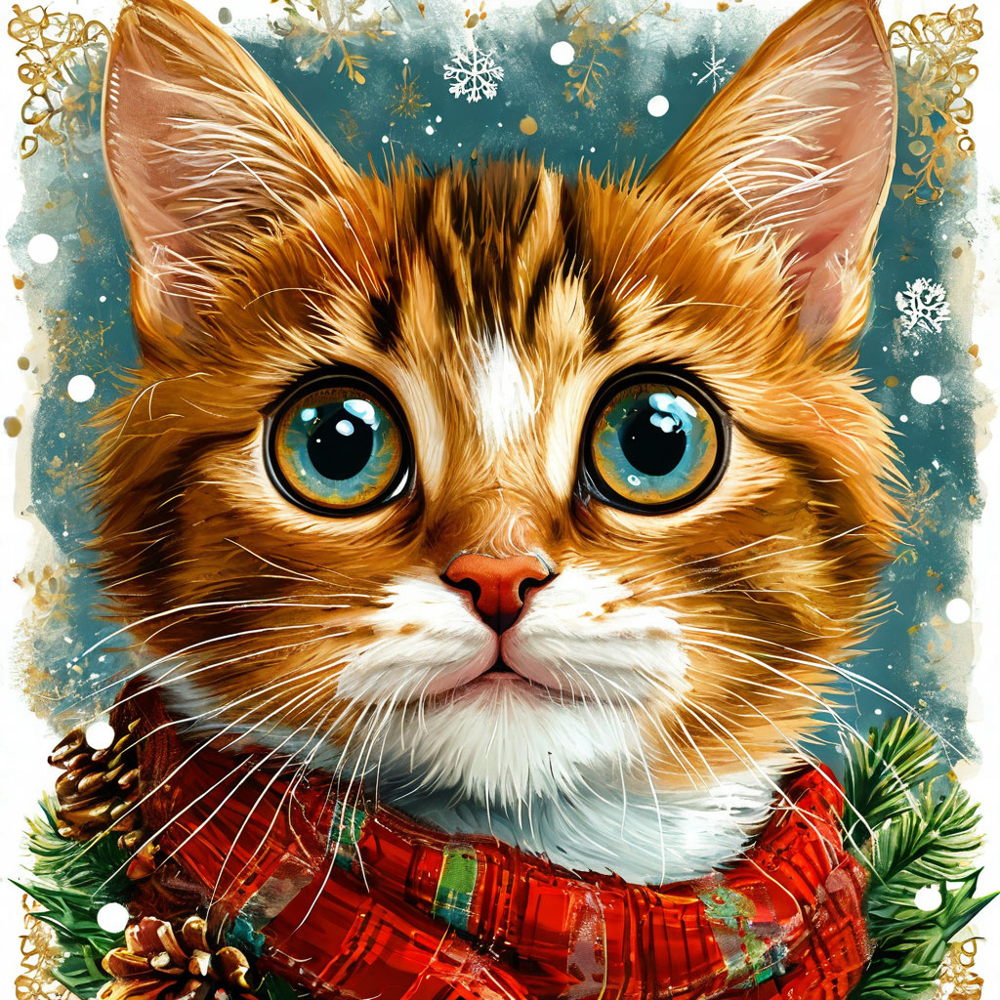

In [14]:
import io
from PIL import Image
import base64

def decode_image(base64_str):
    return Image.open(io.BytesIO(base64.decodebytes(bytes(base64_str, "utf-8"))))

def check(id):
    res = call_api_get(f"https://llm.api.cloud.yandex.net:443/operations/{id}",{})
    if 'done' in res and res['done']:
        return decode_image(res['response']['image'])
    else:
        return None

check(id)

Попробуем нарисовать картинку, олицетворяющую какое-нибудь абстрактное понятие, например, **учёность**

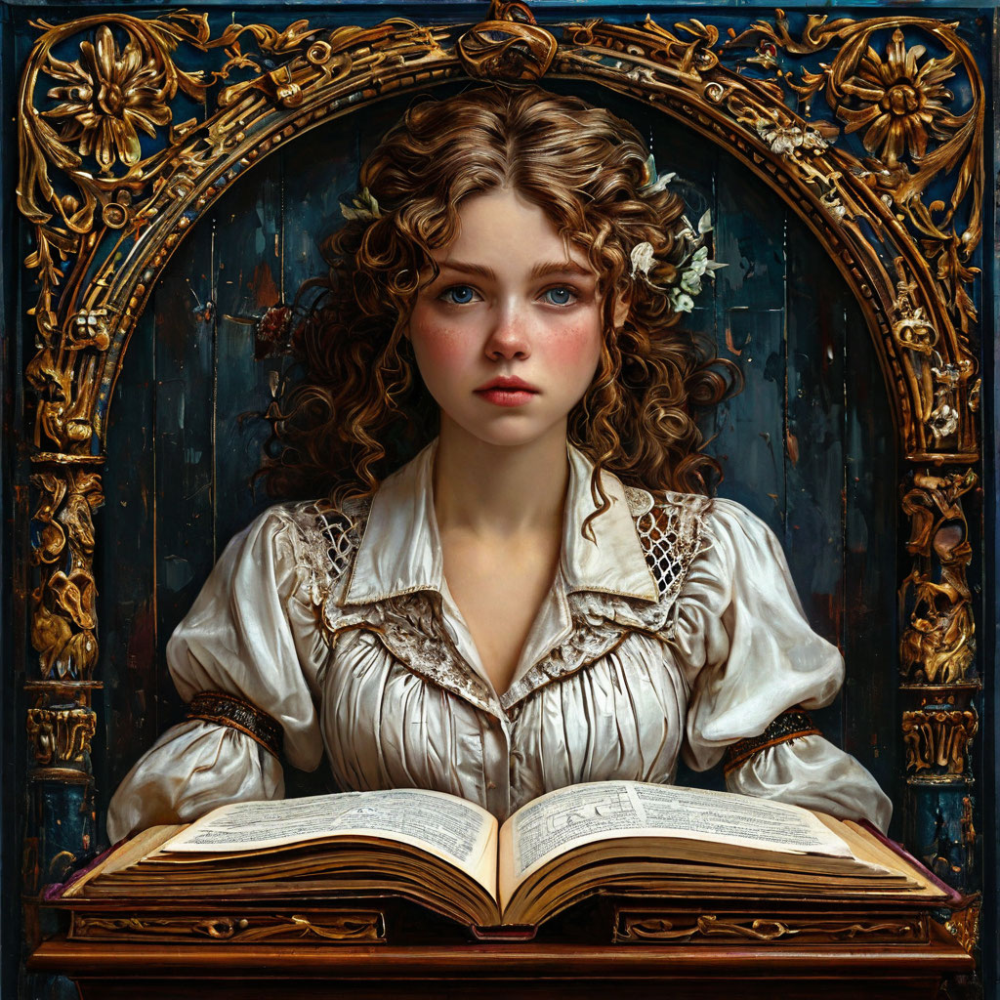

In [15]:
def draw(p):
  id = submit_art(p)
  res = None
  while res is None:
    time.sleep(1)
    res = check(id)
  return res

draw("учёность")

### Задание 2

Попробуйте подобрать такой пропмт, чтобы получилась картинка, ещё лучше отражающая учёность.

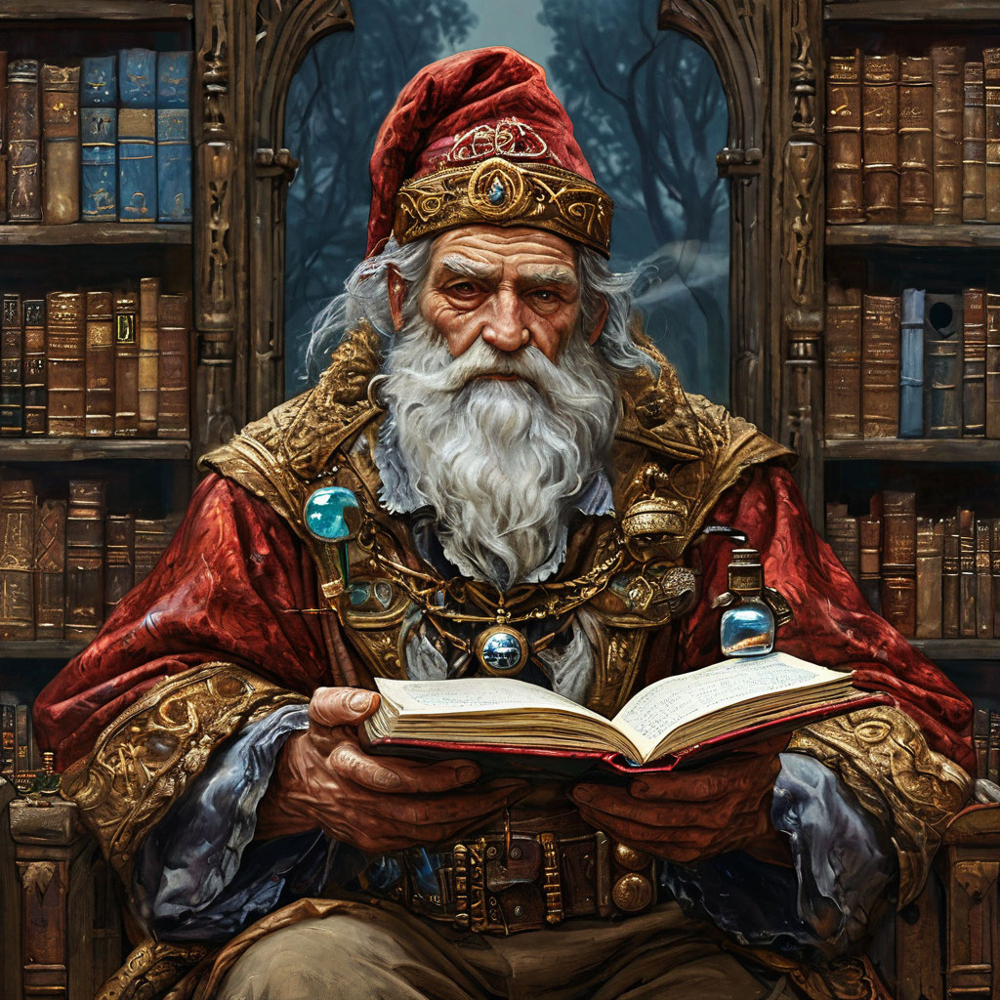

In [16]:
# Пишите код тут

draw('Старец в колпаке с колбой и книгой')

## Комбинация Yandex GPT + Yandex ART

Мы можем поручить создание промпта для картины языковой модели. В этом случае у нас будет задействована языковая модель для создания промпта, и Yandex ART для рисования:

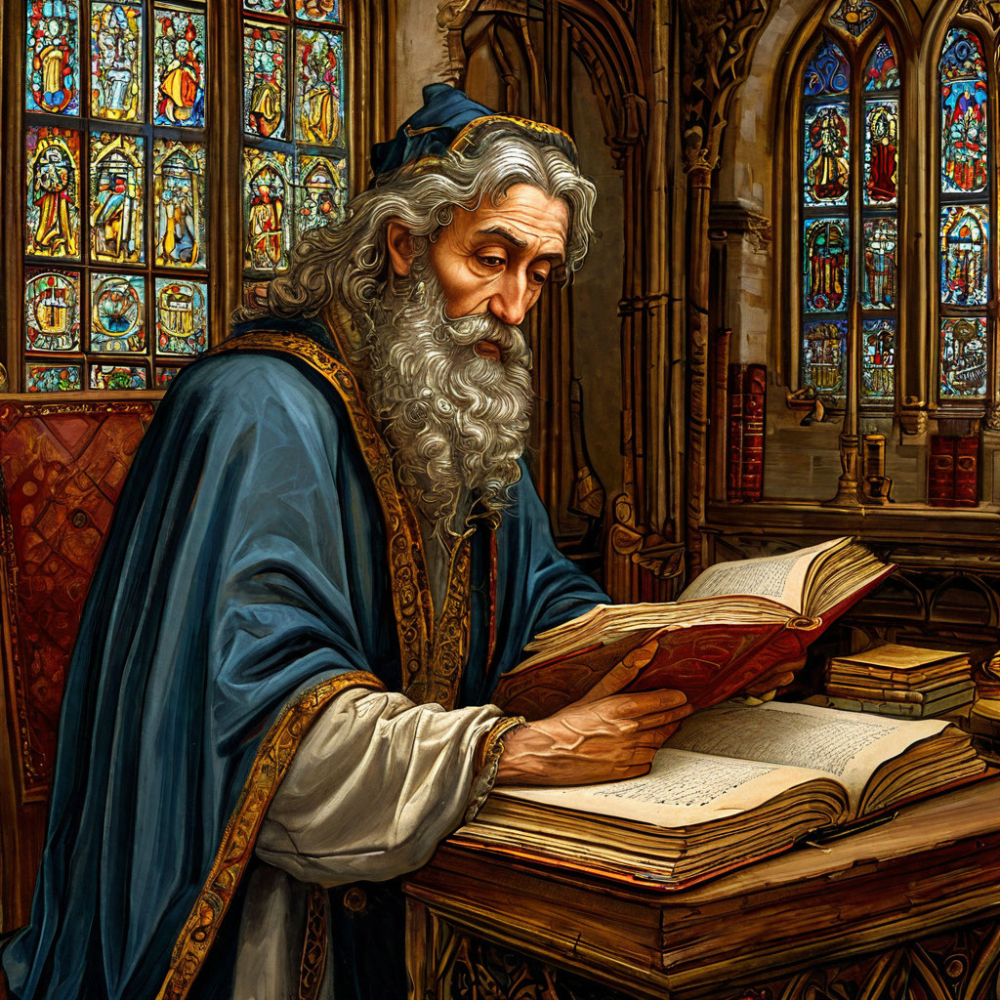

In [19]:
concept = "учёность"

prompt = """
Ты - промпт-инженер, в задачу которого входит создание промптов для генеративной
модели Yadex ART или Stable Diffusion. Тебе необходимо нарисовать картину, иллюстрирующую
понятие {concept}. В качестве результата выдай промпт, который будет лучше всего
описывать это понятие. Не забудь указать также стиль рисунка, его эмоциональные характеристики.
""".replace("{concept}",concept)

res = GPT([HumanMessage(prompt)])
print(res.content)
draw(res.content)

## Задание 3 (сложное)

Попробуйте реализовать придумывание концепции картины "по шагам". Пусть в процессе диалога модель сначала выбирает стиль, продумывает детали, и затем уже формирует промпт. За счет разбиения задачи на более простые шаги, качество выполнения каждого шага будет выше, и можно получить более качественные результаты.

In [20]:
# Пишите код тут


## Многоагентные системы

Часто результат может получится лучше, если над задачей работают несколько агентов - людей или языковых моделей. Попробуем придумывать сюжет картины в ходе диалога двух агентов - художника и промпт-инженера.

In [25]:
vasya_desc="""
Ты - художник, который хочет нарисовать картину с помощью генеративного ИИ. Ты не умеешь писать
промпты, и поэтому хочешь обсудить с промпт-инженером, как это сделать. Ваша задача - совместными
усилиями нарисовать картину на тему {concept}. Твоя задача - говорить, что должно быть
изображено на картине, но не надо писать промпт для нейросети - просто говори, что бы ты хотел
видеть.
""".replace("{concept}",concept)

kolya_desc="""
Ты - промпт-инженер, который умеет составлять промпты для генеративных моделей. Твоя задача - помочь
художнику нарисовать картину. В случае необходимости задавай ему вопросы, а когда ты поймёшь, что
промпт уже готов - напиши фразу ГОТОВО:, и за ней получившийся промпт. Не пиши промпт и фразу "ГОТОВО",
если ты не выяснишь все детали у художника. Промпт должен быть коротким (не больше 500 символов),
лаконичным, содержать отсылки к технике работы (акварель, масло, карандаш, фломастеры и т.д), и
возможно к художественным стилям и приёмам. Никогда не пиши слово "ГОТОВО", пока у тебя не готов финальный
промпт. Длина промпта не должна превышать 500 символов.
"""

vasya = ABot(GPT,vasya_desc)
kolya = ABot(GPT,kolya_desc)

msg = f"Добрый день! Я хочу нарисовать картину про {concept}. Вы поможете мне составить промпт?"

while True:
    print(f"Вася (Х): {msg}")
    msg = kolya(msg)
    print(f"Коля (ПИ): {msg}")
    if "ГОТОВО:" in msg.upper():
        break
    time.sleep(1)
    msg = vasya(msg)
    time.sleep(1)


Вася (Х): Добрый день! Я хочу нарисовать картину про учёность. Вы поможете мне составить промпт?
Коля (ПИ): Нарисуйте картину на тему учёности в стиле академизма акварелью. Изобразите пожилого профессора, окружённого книгами и рукописями, за массивным деревянным столом.
Вася (Х): Мне хотелось бы видеть картину, написанную акварелью, в стиле академизма.

На картине нужно изобразить пожилого профессора с седыми волосами и бородой. Он одет в костюм и сидит за массивным деревянным столом, покрытым зелёной или бордовой скатертью. Рядом — стул с высокой спинкой, обитой кожей или бархатом. 

Вокруг профессора множество книг, свитков, рукописей и других источников знаний: фолианты стоят на полках, лежат стопками или разбросаны по столу. Профессор размышляет над текстом одной из них. Его лицо серьёзное и задумчивое, видно, что он сосредоточен на своих исследованиях.

По тону интерьера можно понять, что действие картины происходит в библиотеке. Мягкий свет из окон освещает пространство, создавая

Теперь выделим сам промпт:

In [27]:
prompt = msg.split('ГОТОВО:')[1]
prompt

'\nНапиши промпт для акварельной картины в стиле академизма, изображающей пожилого профессора с седыми волосами и бородой. Он одет в костюм и сидит за массивным деревянным столом, покрытым зелёной или бордовой скатертью. Вокруг множество книг, свитков, рукописей. Профессор размышляет над текстом. Тон интерьера — мягкий, освещение из окон создаёт уют.'

и нарисуем его

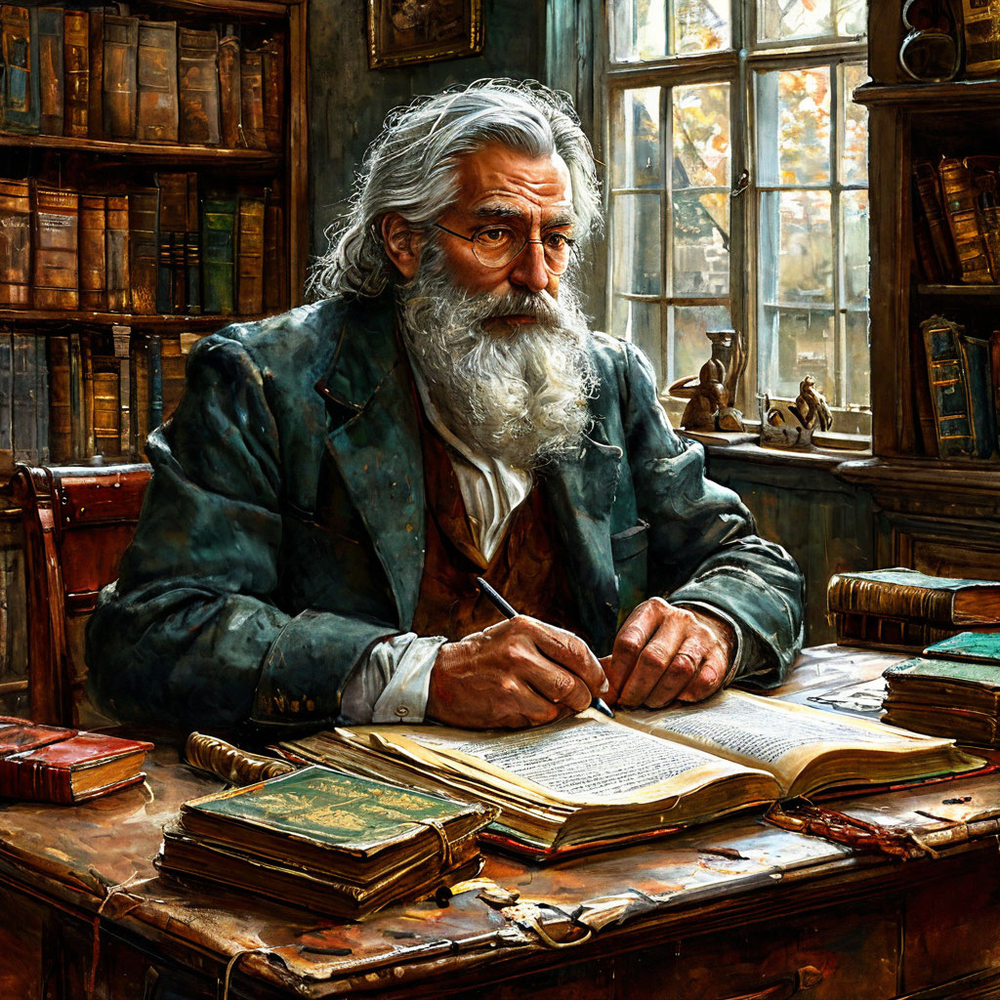

In [29]:
res = draw(prompt)
res

Сохраним получившееся изображение

In [30]:
res.save('scientific_guy.png')

## Задание (финальное)

Попробуйте улучшить промпты, чтобы диалоги между художником и промпт-инженером происходили более осмысленные.

Нарисуйте серию картин с помощью многагентного рисования, иллюстрирующие разные абстрактные понятия.

Посмотрите, насколько нарисованные многоагентной системой картины лучше/хуже того, что вы можете создать сами, вручную придумывая промпт.

Поделитесь результатами!

In [31]:
# Пишите код тут